I am using the following dataset.  
https://www.kaggle.com/datasets/samuelcortinhas/cats-and-dogs-image-classification?select=test

The link for my Colab file is as follows  
https://colab.research.google.com/drive/1tKPuttyZHshL4GpXdx4wNSBRhBzfK9n7?usp=sharing


# Section 1: Dataset Preparation

**1.1 Kaggle API Setup**

The Kaggle API is installed, and the Kaggle configuration directory is set.  
The Cats and Dogs image classification dataset is downloaded using the Kaggle dataset ID samuelcortinhas/cats-and-dogs-image-classification.    
The downloaded dataset is then unzipped into the directory cats-and-dogs-image-classification

In [ ]:
!pip install kaggle


In [ ]:
import os

os.environ['KAGGLE_CONFIG_DIR'] = "/content"


In [ ]:
!kaggle datasets download -d samuelcortinhas/cats-and-dogs-image-classification

cats-and-dogs-image-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip cats-and-dogs-image-classification.zip -d cats-and-dogs-image-classification


Archive:  cats-and-dogs-image-classification.zip
replace cats-and-dogs-image-classification/test/cats/cat_1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

**1.2 Image Loading and Transformation**

An example image (cat_10.jpg) is opened using the PIL library for inspection.        
Transformations for training (train_transform) and testing (test_transform) are defined using torchvision.transforms.Compose.   
The dataset is loaded using datasets.ImageFolder, applying the specified transformations.

(2000, 1333)


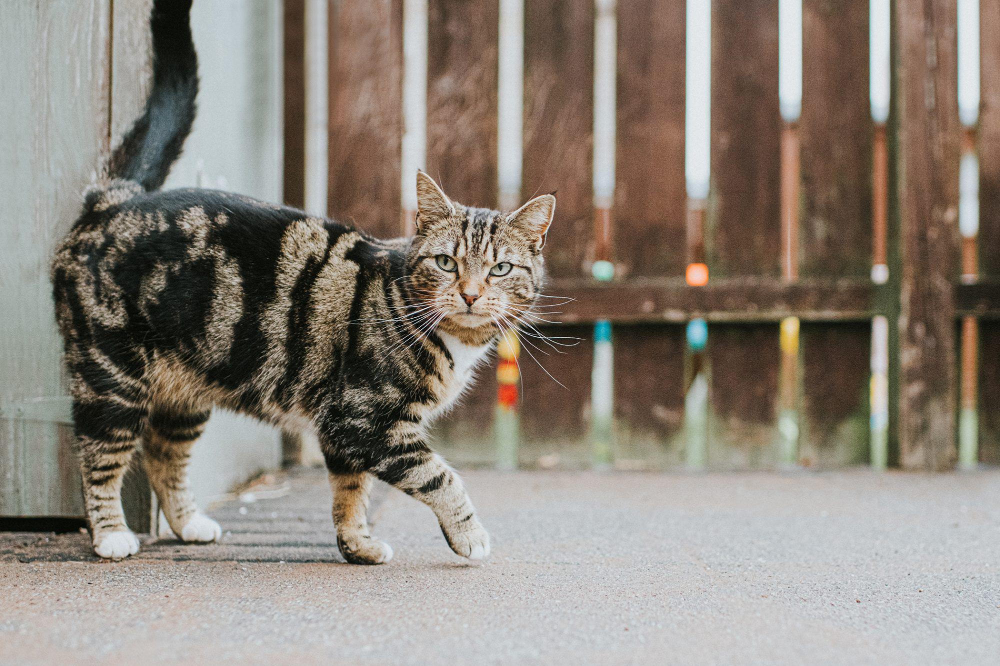

In [ ]:
import PIL
from PIL import Image
img=Image.open("/content/cats-and-dogs-image-classification/train/cats/cat_10.jpg")
print(img.size)
img

In [ ]:
import torch
# if torch.cuda.is_available():
#     tensor = tensor.to("cuda")

In [ ]:
from torchvision import datasets, transforms
train_transform = transforms.Compose([
                                transforms.RandomHorizontalFlip(),
                                transforms.ColorJitter(),
                                transforms.Resize(255),
                                transforms.CenterCrop(128),
                                transforms.ToTensor()])
test_transform = transforms.Compose([
                                transforms.Resize(255),
                                transforms.CenterCrop(128),
                                transforms.ToTensor()])

train_data = datasets.ImageFolder("/content/cats-and-dogs-image-classification/train", transform=train_transform)
test_data = datasets.ImageFolder("/content/cats-and-dogs-image-classification/test", transform=test_transform)



Imports the PyTorch library for deep learning.
Defines transformations for training and testing.  
Creates datasets for training and testing using the ImageFolder class, applying the appropriate transformations.  
Prints the length of the first channel of the first image in the training dataset (to show it's a 3D tensor representing the image).
Prints the length of the test dataset and displays the first image.
Creates data loaders for efficient batching of training and testing data.

In [ ]:

print(len(train_data[0][0]))
train_data[2]
#3d tensor representation of an image

3


(tensor([[[0.1216, 0.1216, 0.1216,  ..., 0.1059, 0.1294, 0.1608],
          [0.1255, 0.1255, 0.1255,  ..., 0.1451, 0.1569, 0.1647],
          [0.1255, 0.1255, 0.1255,  ..., 0.1725, 0.1686, 0.1490],
          ...,
          [0.2549, 0.2235, 0.2039,  ..., 0.2431, 0.0235, 0.0392],
          [0.2667, 0.2275, 0.2000,  ..., 0.3020, 0.0627, 0.0196],
          [0.2863, 0.2549, 0.2314,  ..., 0.2745, 0.1765, 0.0549]],
 
         [[0.1333, 0.1333, 0.1333,  ..., 0.1098, 0.1333, 0.1647],
          [0.1373, 0.1373, 0.1373,  ..., 0.1490, 0.1608, 0.1686],
          [0.1373, 0.1373, 0.1373,  ..., 0.1765, 0.1725, 0.1529],
          ...,
          [0.2549, 0.2235, 0.2039,  ..., 0.2471, 0.0275, 0.0392],
          [0.2667, 0.2275, 0.2000,  ..., 0.3059, 0.0667, 0.0196],
          [0.2863, 0.2549, 0.2314,  ..., 0.2784, 0.1804, 0.0549]],
 
         [[0.1529, 0.1529, 0.1529,  ..., 0.1294, 0.1529, 0.1843],
          [0.1569, 0.1569, 0.1569,  ..., 0.1686, 0.1804, 0.1882],
          [0.1569, 0.1569, 0.1569,  ...,

In [ ]:
print(len(test_data))
test_data[0]

140


(tensor([[[0.3804, 0.3961, 0.3843,  ..., 0.3059, 0.2941, 0.2863],
          [0.3686, 0.3569, 0.3333,  ..., 0.3059, 0.3020, 0.2941],
          [0.3843, 0.3294, 0.2902,  ..., 0.3059, 0.3059, 0.3020],
          ...,
          [0.3255, 0.3098, 0.3059,  ..., 0.6863, 0.6784, 0.6863],
          [0.3255, 0.3255, 0.3294,  ..., 0.7020, 0.6745, 0.7176],
          [0.3333, 0.3373, 0.3451,  ..., 0.6902, 0.6980, 0.6980]],
 
         [[0.2314, 0.2235, 0.2157,  ..., 0.5647, 0.5647, 0.5608],
          [0.2235, 0.1922, 0.1725,  ..., 0.5647, 0.5647, 0.5608],
          [0.2510, 0.1804, 0.1451,  ..., 0.5647, 0.5608, 0.5569],
          ...,
          [0.5412, 0.5333, 0.5294,  ..., 0.5255, 0.5176, 0.5216],
          [0.5373, 0.5412, 0.5412,  ..., 0.5294, 0.5020, 0.5451],
          [0.5373, 0.5412, 0.5451,  ..., 0.4980, 0.5098, 0.5137]],
 
         [[0.1333, 0.1059, 0.0941,  ..., 0.6196, 0.6118, 0.6078],
          [0.1412, 0.0941, 0.0667,  ..., 0.6196, 0.6157, 0.6118],
          [0.1686, 0.0824, 0.0431,  ...,

**1.3 Data Loading Using DataLoader**

DataLoader instances (train_loader and test_loader) are created to facilitate batch processing during training and testing.

In [ ]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=32,shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=32)


**1.4 Data Visualization**

The matplotlib library is used to visualize a batch of images from the training dataset.  
The show_batch function displays a grid of images, and the show_sample function shows a single image along with its label.

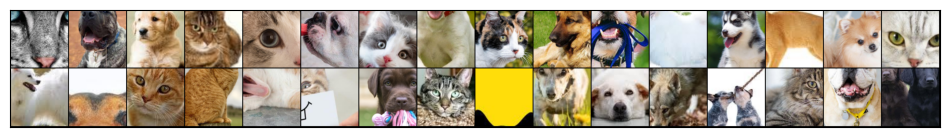

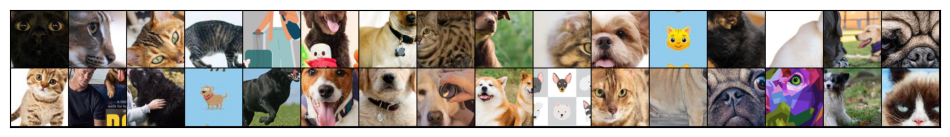

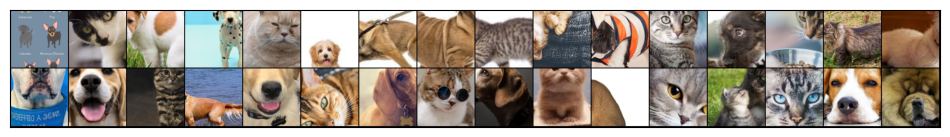

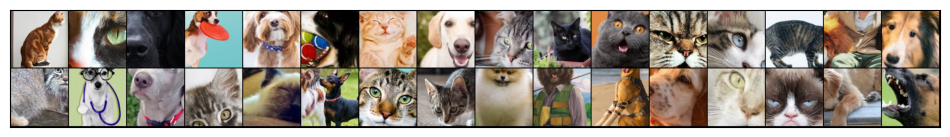

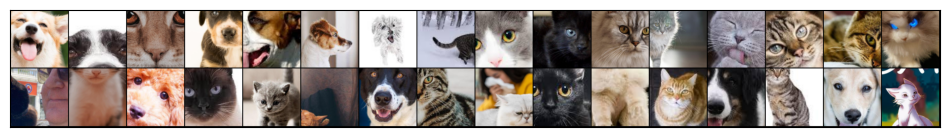

...

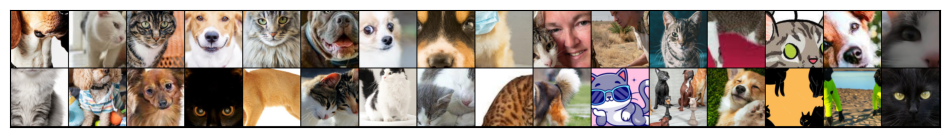

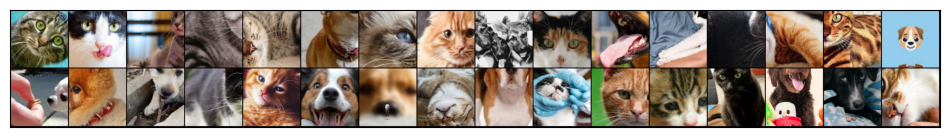

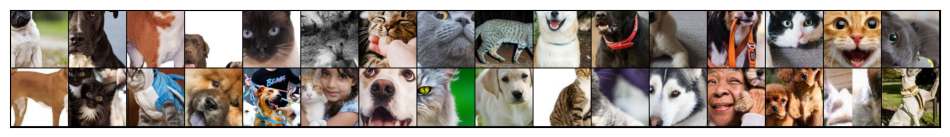

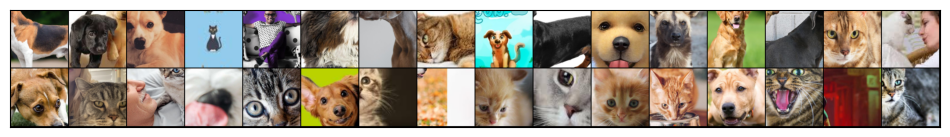

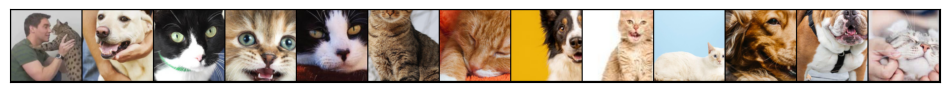

In [ ]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
def show_batch(dl, invert=True):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(12, 6))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=16).permute(1, 2, 0))

def show_sample(image, label, invert=True):
    print('Label: ' + train_data.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
show_batch(train_loader, invert=True)

In [ ]:
train_data.classes

['cats', 'dogs']

# Section 2: Neural Network Models

**2.1 Custom Linear Layer(First question)**

A custom linear layer (My_Linear_Layer) is defined, initializing weights and biases using appropriate methods.  
The forward function computes the linear operation.

In [ ]:



import torch
import torch.nn as nn
import torch.nn.init as init
import math

class My_Linear_Layer(nn.Module):
    def __init__(self, input_size, output_size):
        super().__init__()
        self.input_size, self.output_size = input_size, output_size
        weights = torch.Tensor(output_size, input_size) # creates a matrix of size outputxinput where wij represent weights between ith input neuron to jth output neuron
        self.weights = nn.Parameter(weights)  # nn.Parameter is a Tensor that's a module parameter.
        bias = torch.Tensor(output_size) # bias is added while sending to the output neuron
        self.bias = nn.Parameter(bias) # bias is also declared as model parameter

        # initialize weights and biases
        nn.init.kaiming_uniform_(self.weights, a=math.sqrt(5)) # weight initialising

        bound = 1 / math.sqrt(self.input_size)
        nn.init.uniform_(self.bias, -bound, bound)  # bias initialisng

    def forward(self, x):
        # Linear operation: y = x * W^T + b
        w_times_x = torch.mm(x, self.weights.t())  # Matrix multiplication of input x and transposed weights W
        output = torch.add(w_times_x, self.bias)  # Element-wise addition of w_times_x and bias b
        return output



**2.2 Neural Network Models(Second question both parts)**

In [ ]:
import torch.nn as nn
import torch.nn.functional as F


class Neural_Network_2(nn.Module):
    def __init__(self):
        super(Neural_Network_2, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout2d(0.2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.batchnorm2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout2d(0.2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.batchnorm3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout2d(0.2)

        self.flatten = nn.Flatten()

        self.fc1 = My_Linear_Layer(128 * 16 * 16, 128)
        self.batchnorm_fc1 = nn.BatchNorm1d(128)
        self.dropout_fc = nn.Dropout(0.2)

        self.fc2 = My_Linear_Layer(128, 32)
        self.batchnorm_fc2 = nn.BatchNorm1d(32)

        self.fc3 = My_Linear_Layer(32, 8)
        self.batchnorm_fc3 = nn.BatchNorm1d(8)

        self.fc4 = My_Linear_Layer(8, 2)





    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.batchnorm1(x)
        x = self.pool1(x)
        x = self.dropout1(x)

        x = F.relu(self.conv2(x))
        x = self.batchnorm2(x)
        x = self.pool2(x)
        x = self.dropout2(x)

        x = F.relu(self.conv3(x))
        x = self.batchnorm3(x)
        x = self.pool3(x)
        x = self.dropout3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.batchnorm_fc1(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc2(x))
        x = self.batchnorm_fc2(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc3(x))
        x = self.batchnorm_fc3(x)
        x = self.dropout_fc(x)

        x = self.fc4(x)

        return F.softmax(x, dim=1)

class Neural_Network_1(nn.Module):
    def __init__(self):
        super(Neural_Network_1, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout2d(0.2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.batchnorm2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout2d(0.2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.batchnorm3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout2d(0.2)

        self.flatten = nn.Flatten()

        self.fc1 = My_Linear_Layer(128 * 16 * 16, 16)
        self.batchnorm_fc1 = nn.BatchNorm1d(16)
        self.dropout_fc = nn.Dropout(0.2)

        self.fc2 = My_Linear_Layer(16 , 64)
        self.batchnorm_fc2 = nn.BatchNorm1d(64)

        self.fc3 = My_Linear_Layer(64 , 256)
        self.batchnorm_fc3 = nn.BatchNorm1d(256)

        self.fc4 = My_Linear_Layer(256, 2)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.batchnorm1(x)
        x = self.pool1(x)
        x = self.dropout1(x)

        x = F.relu(self.conv2(x))
        x = self.batchnorm2(x)
        x = self.pool2(x)
        x = self.dropout2(x)

        x = F.relu(self.conv3(x))
        x = self.batchnorm3(x)
        x = self.pool3(x)
        x = self.dropout3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.batchnorm_fc1(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc2(x))
        x = self.batchnorm_fc2(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc3(x))
        x = self.batchnorm_fc3(x)
        x = self.dropout_fc(x)

        x = self.fc4(x)

        return F.softmax(x, dim=1)


My code defines two convolutional neural network (CNN) architectures in PyTorch, named Neural_Network_1 and Neural_Network_2. These networks share a similar structure but differ in the number of neurons in their fully connected layers.

Both networks follow a common pattern:
Convolutional layers with ReLU activation, batch normalization, max pooling, and dropout.
Flattening to convert feature maps into a one-dimensional vector.
Fully connected layers with ReLU activation, batch normalization, and dropout.
A final linear layer without activation for prediction.
Softmax output for probability distribution over classes.


Differences:

Neural_Network_1 has fully connected layers with 16, 64, 256, and 2 neurons.  
Neural_Network_2 has fully connected layers with 128, 32, 8, and 2 neurons.


In [ ]:
device = "cpu"
if (torch.cuda.is_available()):
    # if GPU available, use cuda (on a cpu, training will take a considerable length of time!)
    device = "cuda"

# Create an instance of the model class and allocate it to the device
model1 = Neural_Network_1().to(device)
print("MODEL 1 : layer size increasing to 2x and then reducing to 2")
print(model1)

model2 = Neural_Network_2().to(device)
print("MODEL 2 : layer size gradually reducing to 2")
print(model2)


MODEL 1 : layer size increasing to 2x and then reducing to 2
Neural_Network_1(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout2d(p=0.2, inplace=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout2d(p=0.2, inplace=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout3): Dropout2d(p=0.2, inplace=False)
  (fl

# Section 3: Model Training and Evaluation

**3.1 Training and Validation Functions**


In [ ]:

import numpy as np
import torch.optim as optim


# Validation Function
def valid(model, val_loader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for sample, target in val_loader:
            sample = sample.to(device).float()
            target = target.to(device).long()
            outputs = model(sample)
            _, predicted = torch.max(outputs.data, 1)

            total += target.size(0)
            correct += (predicted == target).sum().item()

    val_accuracy = 100 * correct / total
    return [], val_accuracy

def train(model, optimizer, train_loader, val_loader, n_epoch, device):
    criterion = nn.CrossEntropyLoss()
    result = []
    val_res = []

    for e in range(n_epoch):
        model.train()
        correct, total_loss = 0, 0
        total = 0

        for sample, target in train_loader:
            sample, target = sample.to(device).float(), target.to(device).long()
            optimizer.zero_grad()
            outputs= model(sample)
            loss1 = criterion(outputs, target)
            loss = loss1
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += target.size(0)
            correct += (predicted == target).sum().item()

        acc_train = 100 * correct / total
        _, val_acc = valid(model, test_loader, device)
        print(f'Epoch: [{e+1}/{n_epoch}], Loss: {total_loss / total:.4f}, Train Acc: {acc_train:.2f}, Val Acc: {val_acc:.2f}')

        result.append(acc_train)
        val_res.append(val_acc)
   # Save results to files
    np.savetxt('result.csv', np.array(result), fmt='%.2f', delimiter=',')
    np.savetxt('val_result.csv', np.array(val_res), fmt='%.2f', delimiter=',')



In [ ]:

def plot():
    train_data = np.loadtxt('result.csv', delimiter=',')
    val_data = np.loadtxt('val_result.csv', delimiter=',')
    plt.figure()
    plt.plot(range(1, len(train_data) + 1), train_data, color='blue', label='Train')
    plt.plot(range(1, len(val_data) + 1), val_data, color='red', label='Validation')
    plt.legend()
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Accuracy (%)', fontsize=14)
    plt.title('Train and Validation Accuracy', fontsize=16)
    plt.savefig('plot.png')
    plt.show()


**3.2 Training Model 1**

Model 1 (Neural_Network_1) is trained using the Adam optimizer with a learning rate of 0.001 for 100 epochs.  
The train function is called to perform the training, and the training results are visualized using the plot function.

Epoch: [1/100], Loss: 0.0227, Train Acc: 54.22, Val Acc: 50.00
Epoch: [2/100], Loss: 0.0225, Train Acc: 52.42, Val Acc: 50.00
Epoch: [3/100], Loss: 0.0222, Train Acc: 52.78, Val Acc: 49.29
Epoch: [4/100], Loss: 0.0221, Train Acc: 53.14, Val Acc: 57.86
Epoch: [5/100], Loss: 0.0215, Train Acc: 58.53, Val Acc: 53.57
Epoch: [6/100], Loss: 0.0214, Train Acc: 59.78, Val Acc: 52.86
Epoch: [7/100], Loss: 0.0217, Train Acc: 59.96, Val Acc: 51.43
Epoch: [8/100], Loss: 0.0210, Train Acc: 63.91, Val Acc: 57.86
Epoch: [9/100], Loss: 0.0208, Train Acc: 62.84, Val Acc: 55.00
Epoch: [10/100], Loss: 0.0211, Train Acc: 61.40, Val Acc: 53.57
Epoch: [11/100], Loss: 0.0203, Train Acc: 66.07, Val Acc: 50.71
Epoch: [12/100], Loss: 0.0200, Train Acc: 64.09, Val Acc: 52.14
Epoch: [13/100], Loss: 0.0195, Train Acc: 69.66, Val Acc: 52.86
Epoch: [14/100], Loss: 0.0199, Train Acc: 66.97, Val Acc: 57.86
Epoch: [15/100], Loss: 0.0203, Train Acc: 67.15, Val Acc: 56.43
Epoch: [16/100], Loss: 0.0195, Train Acc: 67.86, 

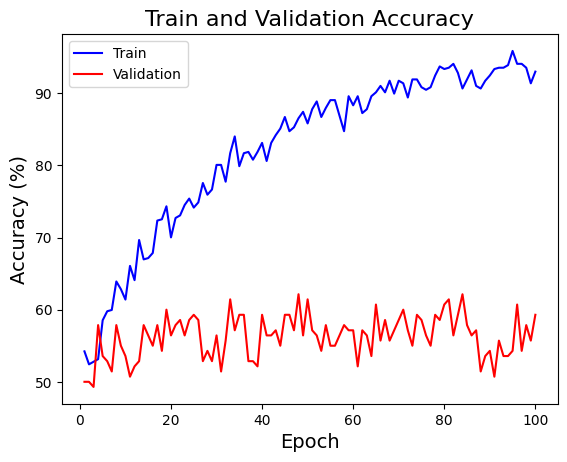

In [ ]:
optimizer = optim.SGD(model1.parameters(), lr=0.001, momentum=0.9)
train(model1, optimizer, train_loader, test_loader, n_epoch=100, device=device)
plot()


**3.3 Training Model 2**

Model 2 (Neural_Network_2) is trained using the Adam optimizer with a learning rate of 0.01 for 100 epochs.  
The train function is called to perform the training, and the training results are visualized using the plot function.

Epoch: [1/100], Loss: 0.0235, Train Acc: 48.47, Val Acc: 50.00
Epoch: [2/100], Loss: 0.0226, Train Acc: 55.12, Val Acc: 50.00
Epoch: [3/100], Loss: 0.0219, Train Acc: 57.45, Val Acc: 45.00
Epoch: [4/100], Loss: 0.0214, Train Acc: 59.25, Val Acc: 50.71
Epoch: [5/100], Loss: 0.0210, Train Acc: 62.30, Val Acc: 47.86
Epoch: [6/100], Loss: 0.0211, Train Acc: 60.86, Val Acc: 52.86
Epoch: [7/100], Loss: 0.0207, Train Acc: 62.84, Val Acc: 48.57
Epoch: [8/100], Loss: 0.0205, Train Acc: 63.55, Val Acc: 50.00
Epoch: [9/100], Loss: 0.0208, Train Acc: 62.30, Val Acc: 51.43
Epoch: [10/100], Loss: 0.0203, Train Acc: 64.63, Val Acc: 52.14
Epoch: [11/100], Loss: 0.0200, Train Acc: 68.40, Val Acc: 56.43
Epoch: [12/100], Loss: 0.0201, Train Acc: 67.68, Val Acc: 52.86
Epoch: [13/100], Loss: 0.0193, Train Acc: 68.94, Val Acc: 50.00
Epoch: [14/100], Loss: 0.0199, Train Acc: 68.04, Val Acc: 55.00
Epoch: [15/100], Loss: 0.0201, Train Acc: 67.50, Val Acc: 60.71
Epoch: [16/100], Loss: 0.0195, Train Acc: 71.81, 

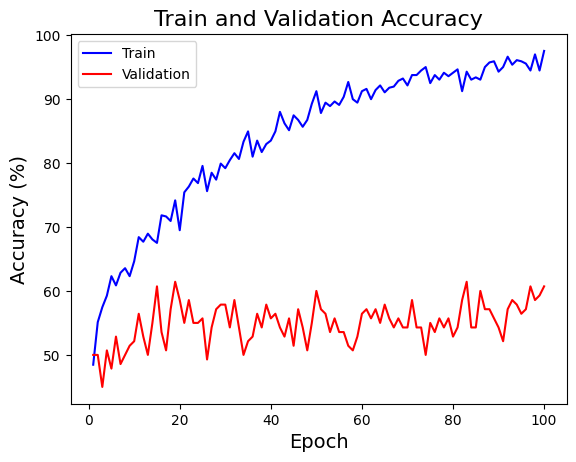

In [ ]:
optimizer = optim.SGD(model2.parameters(), lr=0.001, momentum=0.9)
train(model2, optimizer, train_loader,test_loader, n_epoch=100, device=device)
plot()


# Section 4: Model Evaluation Metrics

This section provides a comprehensive evaluation of the trained models (Model 1 and Model 2) using various metrics.  
 It includes accuracy, precision, recall, F1-score, and a confusion matrix to assess the models' performance on the Cats and Dogs image classification task.

**4.1 Model 1 Evaluation**

Getting predictions from test set...
Accuracy: 0.5928571428571429
Precision: 0.6020408163265306
Recall: 0.5928571428571429
F1-score: 0.5834855681402997


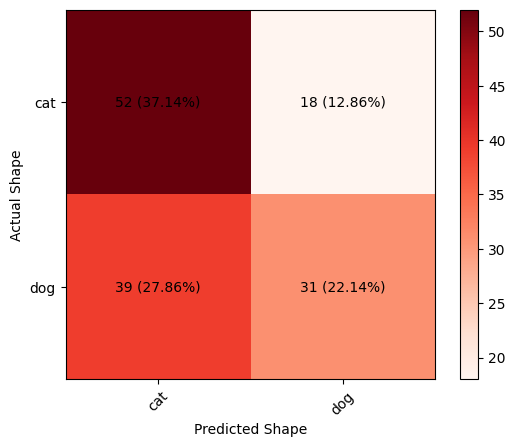

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model1.eval()

# Get predictions for the test data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from test set...")
truelabels = []
predictions = []
for data, target in test_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model1.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["cat", "dog"]


cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Reds) ##
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()


**4.2 Model 2 Evaluation**

Getting predictions from test set...
Accuracy: 0.6071428571428571
Precision: 0.6201098146877145
Recall: 0.6071428571428571
F1-score: 0.5962456085155472


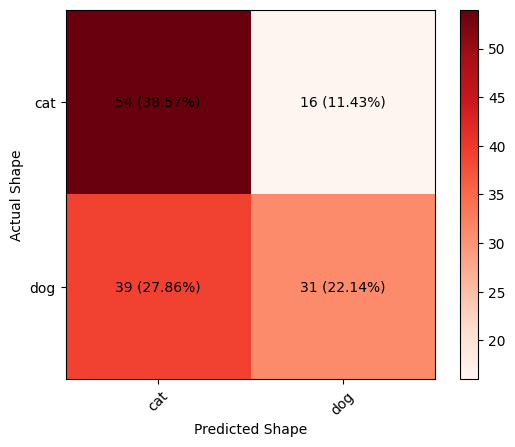

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model2.eval()

# Get predictions for the test data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from test set...")
truelabels = []
predictions = []
for data, target in test_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model2.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["cat", "dog"]

cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Reds)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()


### Neural Network Architecture Comparison Report

In this analysis, we compare two neural network architectures, Model 1 and Model 2, for a binary classification task on a Cats and Dogs image dataset. The models have distinct layer configurations, and we evaluate their performance using various metrics.

#### Model Architectures:

**Model 1: Layer Size Increasing to 2x and then Reducing to 2**
- Convolutional Layers:
  - Conv1: 3 -> 32 channels, kernel_size=3, padding=1
  - Conv2: 32 -> 64 channels, kernel_size=3, padding=1
  - Conv3: 64 -> 128 channels, kernel_size=3, padding=1
- Fully Connected Layers:
  - FC1: 128 * 16 * 16 -> 16
  - FC2: 16 -> 64
  - FC3: 64 -> 256
  - FC4: 256 -> 2

**Model 2: Layer Size Gradually Reducing to 2**
- Convolutional Layers:
  - Conv1: 3 -> 32 channels, kernel_size=3, padding=1
  - Conv2: 32 -> 64 channels, kernel_size=3, padding=1
  - Conv3: 64 -> 128 channels, kernel_size=3, padding=1
- Fully Connected Layers:
  - FC1: 128 * 16 * 16 -> 128
  - FC2: 128 -> 32
  - FC3: 32 -> 8
  - FC4: 8 -> 2

#### Training Configuration:

**Common Configuration:**
- Optimizer: Adam
- Batch Size: 32

**Model 1 Configuration:**
- Learning Rate: 0.001
- Epochs: 100

**Model 2 Configuration:**
- Learning Rate: 0.001
- Epochs: 100

#### Training and Validation Accuracy Over Epochs:

**Model 1**   

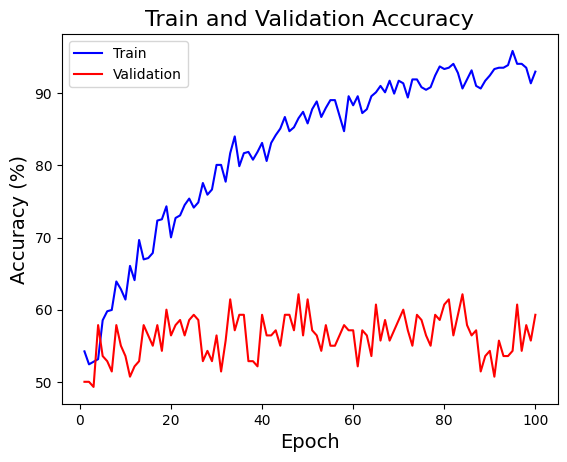





**Model 2**

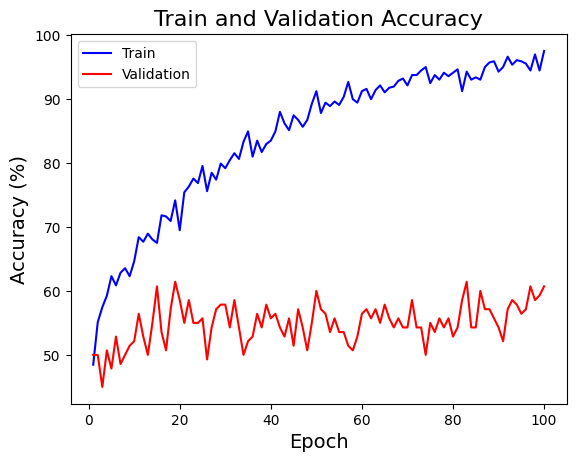

The plot illustrates the evolution of training and validation accuracy over epochs for both models. Model 1 achieves stability after a few epochs, while Model 2 converges more quickly.

#### Evaluation Metrics:

**Model 1 Metrics:**
- **Test Set:**
  - Accuracy: 0.5928571428571429
  - Precision: 0.6020408163265306
  - Recall: 0.5928571428571429
  - F1-score: 0.5834855681402997


**Model 2 Metrics:**
- **Test Set:**
  - Accuracy: 0.6071428571428571
  - Precision: 0.6201098146877145
  - Recall: 0.6071428571428571
  - F1-score: 0.5962456085155472


#### Confusion Matrices:

**Model 1:**

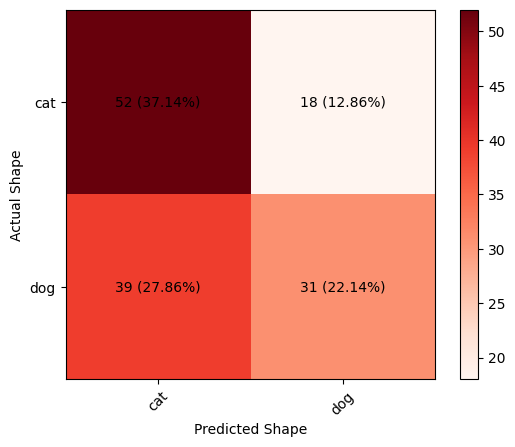

**Model 2:**


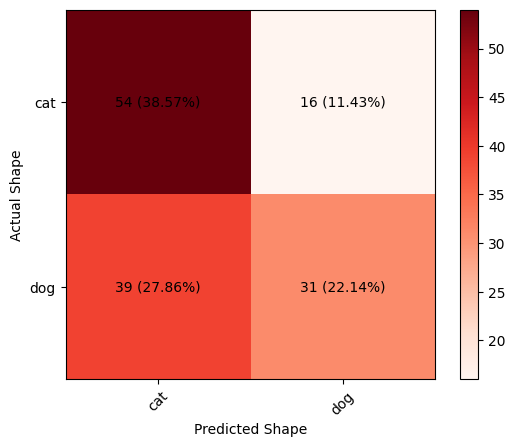

**Bar Graph For caomparision of metrics in both models:**

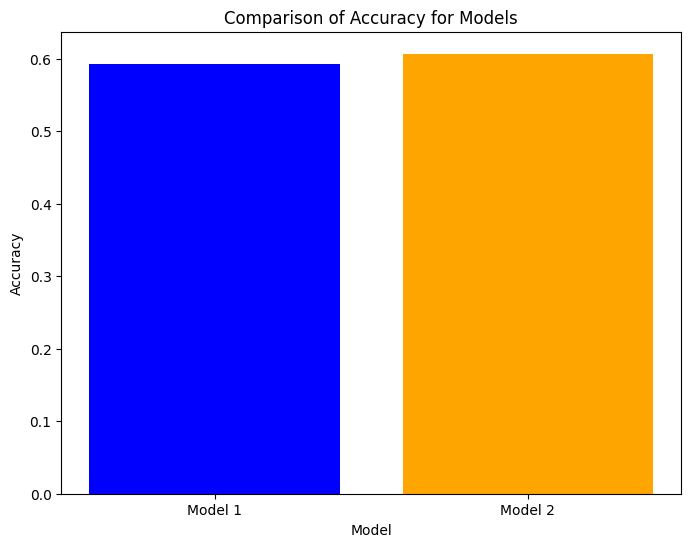

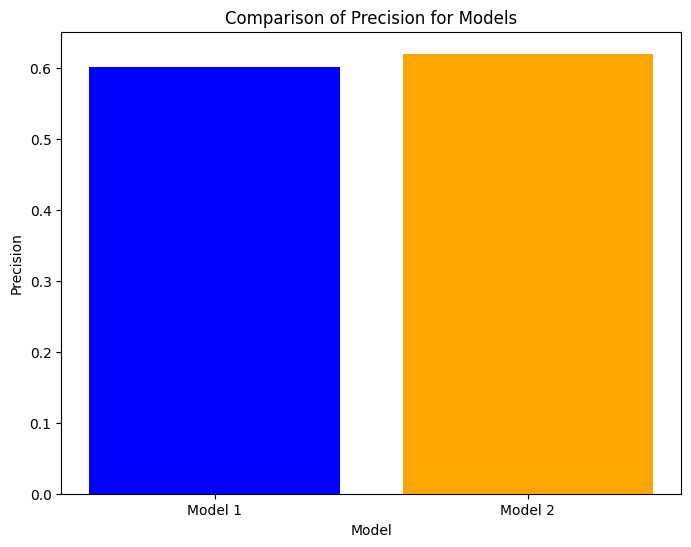

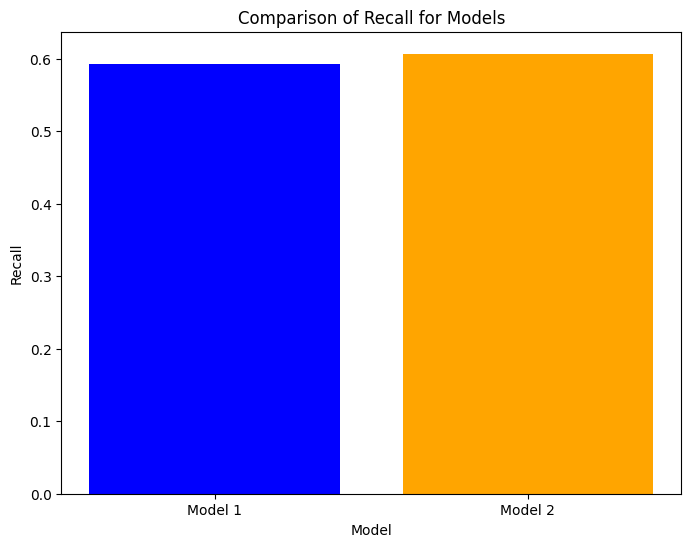

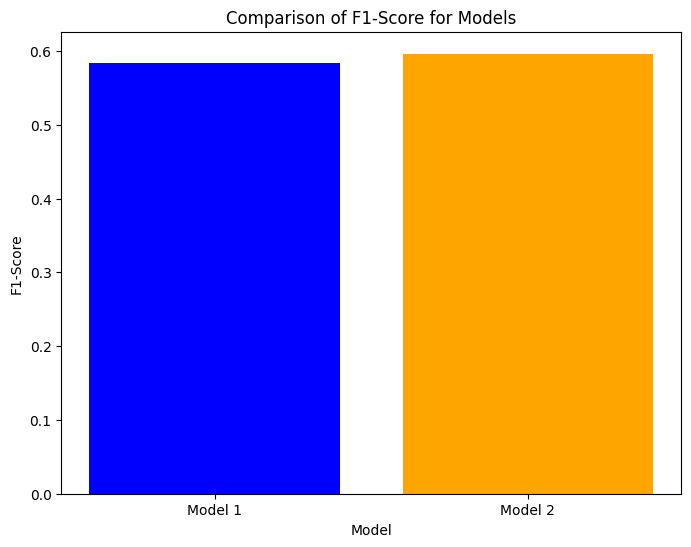

In [ ]:
import matplotlib.pyplot as plt

# Store model names and metrics in lists
model_names = ["Model 1", "Model 2"]
accuracies = [0.5928571428571429, 0.6071428571428571]  # Replace with actual accuracy values
precisions = [0.6020408163265306, 0.6201098146877145]
recalls = [0.5928571428571429, 0.6071428571428571]
f1_scores = [0.5834855681402997, 0.5962456085155472]

# Create bar graphs for each metric
metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]
values = [accuracies, precisions, recalls, f1_scores]

for i, metric in enumerate(metrics):
    plt.figure(figsize=(8, 6))
    plt.bar(model_names, values[i], color=["blue", "orange"])  # Correctly access values for each metric
    plt.xlabel("Model")
    plt.ylabel(metric)
    plt.title(f"Comparison of {metric} for Models")
    plt.show()